Задание первого проекта состоит из 2 задач:
1) Создать модель для симуляции 3 скоррелированных между собой риск-факторов:
Мгновенная процентная ставка для валюты Рубль
Мгновенная процентная ставка для валюты Доллар США
Обменный курс Рубль-Доллар
Для симуляции процентных ставок использовать модель Кокса-Ингерсолла-Росса (CIR)
Для симуляции обменного курса использовать логарифмическую модель (будет дана на ближайшей лекции)
Симуляции провести для расчетной даты 10.12.2021
Необходимы комментарии - обоснования для выборов параметров моделей (волатильность, уровень среднего, скорость возврата к среднему и т.д.)
Выбор шага симуляции и количества симуляций обосновать (используя 2 задачу проекта)
Для симуляций могут быть выбраны с обоснованиями за дополнительный балл и другие симуляционные модели, основанные на стохдиффурах

2) На основании симуляций динамики процентной ставки для рубля оценить справедливую стоимость для продукта Range Accrual
Для прайсинга необходимо создать отдельный модуль, который будет принимать на вход список параметров продукта:
Верхняя граница диапазона (или ее отсутствие)
Нижняя граница диапазона (или ее отсутствие)
Номинал сделки (максимальную выплату, доступную в случае нахождения внутри диапазона в течение всего срока жизни сделки)
Дата начала действия контракта
Дата окончания действия контракта
Модуль прайсинга вызывает модель симуляции процентной ставки и принимает обратно симуляции с началом в дату начала действия контракта (для простоты считаем, что расчеты проводим в динь заключения). В качестве результата выдаем справедливую стоимость дериватива

In [2]:
import requests
from bs4 import BeautifulSoup as bs
import pandas as pd

!pip install quandl
import quandl
!pip install fredapi
import fredapi
from fredapi import Fred
import yfinance as yf

import numpy as np
import matplotlib.pyplot as plt

from datetime import datetime, timedelta

from sklearn.metrics import mean_absolute_error
from tqdm import tqdm

In [3]:
start_date = "2017-01-01"
end_date = "2021-12-10"

In [4]:
quandl.ApiConfig.api_key = "-CxKb89XJyAxH1ys5oYh"
df_libor = quandl.get(f"USTREASURY/YIELD", start_date=start_date, end_date=end_date)

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
file_path = '/content/drive/MyDrive/СЛУПЫ_ПРОЕКТ/2015-01-01_2023-12-03_MosPrime.xlsx'
df_mosprime_full = pd.read_excel(file_path)
df_mosprime_full['Дата ставки'] = pd.to_datetime(df_mosprime_full['Дата ставки'], format='%d-%m-%Y')

In [7]:
# Парсим MosPrime
file_path = '/content/drive/MyDrive/СЛУПЫ_ПРОЕКТ/2015-01-01_2023-12-03_MosPrime.xlsx'
df_mosprime_full = pd.read_excel(file_path)

df_mosprime_full['Дата ставки'] = pd.to_datetime(df_mosprime_full['Дата ставки'], format='%d-%m-%Y')
df_mosprime = df_mosprime_full[(df_mosprime_full['Дата ставки'] <= pd.to_datetime('10-12-2021', format='%d-%m-%Y'))
                              & (df_mosprime_full['Дата ставки'] >= pd.to_datetime('01-01-2016', format='%d-%m-%Y'))].reset_index(drop=True)
df_mosprime = df_mosprime.rename(columns={'Дата ставки': 'Date', 'ON': 'ON_mosprime'}).drop(['1W', '2W', '1M', '2M', '3M', '6M'], axis=1)
df_mosprime['ON_mosprime'] = df_mosprime['ON_mosprime'].astype(str).str.replace('--', '')
df_mosprime['ON_mosprime'] = df_mosprime['ON_mosprime'].astype(str).str.replace('-', '')
df_mosprime['ON_mosprime'] = df_mosprime['ON_mosprime'].astype(str).str.replace('–', '')
df_mosprime['ON_mosprime'] = df_mosprime['ON_mosprime'].astype(str).str.replace(',', '.')
df_mosprime['ON_mosprime'] = df_mosprime['ON_mosprime'].astype(str).replace('', np.nan)
df_mosprime['ON_mosprime'] = df_mosprime['ON_mosprime'].astype(float)
df_mosprime = df_mosprime.sort_values(by='Date', ascending=True)

###############################################################################################################################################################

# Парсим SOFR
api_key = 'ac967be86c41b0acf8b16a477509e7fb'
fred = Fred(api_key=api_key)
df_sofr = fred.get_series("SOFR", start_date=start_date, end_date=end_date)
df_sofr = pd.DataFrame(df_sofr).reset_index().sort_values(by='index', ascending=True).reset_index(drop=True).rename(columns={'index': 'Date', 0: 'ON_sofr'})
df_sofr['ON_sofr'] = df_sofr['ON_sofr'].astype(float)

###############################################################################################################################################################

# Парсим обменный курс
ticker_symbol = 'USDRUB=X'
df_RUBUSD = yf.download(ticker_symbol, start=start_date, end=end_date)
df_RUBUSD = df_RUBUSD.reset_index().sort_values(by='Date', ascending=True)
df_RUBUSD = df_RUBUSD[(df_RUBUSD['Date'] <= pd.to_datetime('10-12-2021', format='%d-%m-%Y'))
                              & (df_RUBUSD['Date'] >= pd.to_datetime('01-01-2016', format='%d-%m-%Y'))].reset_index(drop=True)
df_RUBUSD = df_RUBUSD[['Date', 'Close']]

###############################################################################################################################################################

# Объединяем 3 показателя в 1 датафрейм
df_rates = df_mosprime.merge(df_sofr, on='Date', how='inner')
df_rates = df_rates.merge(df_RUBUSD, on='Date', how='inner').dropna().reset_index(drop=True)
df_rates[['ON_mosprime', 'ON_sofr']] = df_rates[['ON_mosprime', 'ON_sofr']] / 100
df_rates

[*********************100%%**********************]  1 of 1 completed


,Date,ON_mosprime,ON_sofr,Close
0,2018-04-03,0.0733,0.0183,57.436798
1,2018-04-04,0.0726,0.0174,57.624001
2,2018-04-05,0.0719,0.0175,57.668999
3,2018-04-06,0.0723,0.0175,57.632500
4,2018-04-09,0.0725,0.0175,58.068501
...,...,...,...,...
861,2021-12-03,0.0747,0.0005,73.619499
862,2021-12-06,0.0759,0.0005,73.867798
863,2021-12-07,0.0751,0.0005,74.348198
864,2021-12-08,0.0768,0.0005,73.990303


In [8]:
df_rates.corr()

<ipython-input-8-b313f1030f1b>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_rates.corr()


,ON_mosprime,ON_sofr,Close
ON_mosprime,1.000000,0.793180,-0.725506
ON_sofr,0.793180,1.000000,-0.857391
Close,-0.725506,-0.857391,1.000000


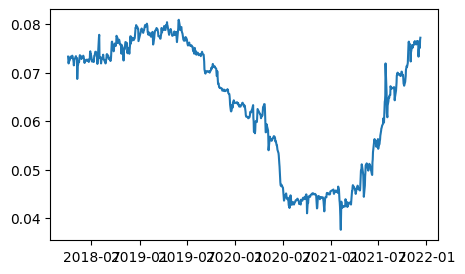

In [9]:
plt.figure(figsize=(5, 3))
plt.plot(df_rates['Date'], df_rates['ON_mosprime'])
plt.show()

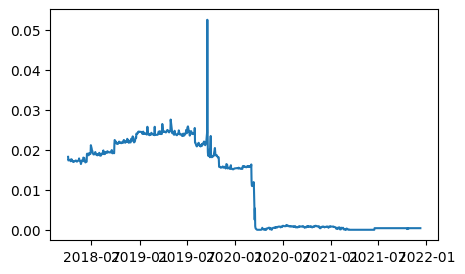

In [10]:
plt.figure(figsize=(5, 3))
plt.plot(df_rates['Date'], df_rates['ON_sofr'])
plt.show()

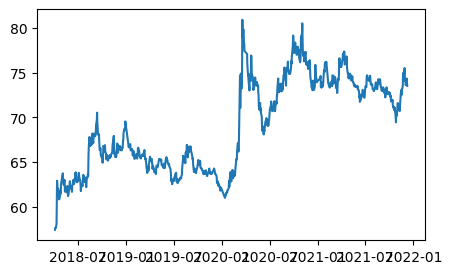

In [11]:
plt.figure(figsize=(5, 3))
plt.plot(df_rates['Date'], df_rates['Close'])
plt.show()

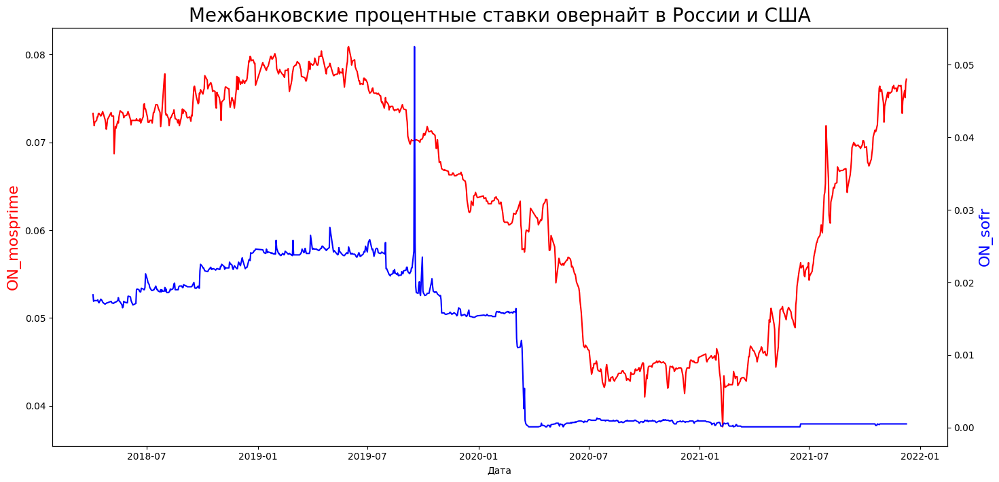

In [12]:
fig, ax = plt.subplots(figsize=(17, 8))
ax.plot(df_rates['Date'], df_rates['ON_mosprime'], color='red')
ax.set_ylabel('ON_mosprime', color='red', fontsize=16)

ax2 = ax.twinx()
ax2.plot(df_rates['Date'], df_rates['ON_sofr'], color='blue')
ax2.set_ylabel('ON_sofr', color='blue', fontsize=16)

ax.set_xlabel("Дата")
plt.title("Межбанковские процентные ставки овернайт в России и США", fontsize=20)
plt.show()

In [13]:
def generate_correlated_data(mos_uncorr, sofr_uncorr, cur_r_uncorr, correlation):
  chol = np.linalg.cholesky(correlation)
  rand_data = np.vstack((mos_uncorr, sofr_uncorr, cur_r_uncorr))
  sim_corr_w = pd.DataFrame(np.matmul(chol, rand_data), index=['Mosprime', 'SOFR', 'Currency_rate']).T/100
  return sim_corr_w['Mosprime'], sim_corr_w['SOFR'], sim_corr_w['Currency_rate']

def cir_model(r0_m, a_m, b_m, sigma_m, r0_s, a_s, b_s, sigma_s, c0, sigma_c, T_, dt_, num_paths, corr):
    """
    :param r0: Начальная процентная ставка
    :param c0: Начальное значение обменного курса
    :param a: Скорость возврата к среднему уровню
    :param b: Уровень средней ставки
    :param sigma: Волатильность
    :param T: Общее время симуляции
    :param dt: Шаг времени
    :param num_paths: Количество симуляционных путей
    :return: Массив процентных ставок по времени для каждого пути
    """
    num_steps = int(T / dt)

    paths_m = np.zeros((num_paths, num_steps + 1))
    paths_m[:, 0] = r0_m

    paths_s = np.zeros((num_paths, num_steps + 1))
    paths_s[:, 0] = r0_s

    paths_c = np.zeros((num_paths, num_steps + 1))
    paths_c[:, 0] = c0

    for i in range(0, num_paths):
        dW_m = np.random.normal(0, np.sqrt(dt), num_steps)
        dW_s = np.random.normal(0, np.sqrt(dt), num_steps)
        dW_c = np.random.normal(0, np.sqrt(dt), num_steps)
        dW_m_corr, dW_s_corr, dW_c_corr = generate_correlated_data(dW_m, dW_s, dW_c, corr)
        for t in range(1, num_steps + 1):
          paths_m[i, t] = paths_m[i, t - 1] + a_m * (b_m - paths_m[i, t - 1]) * dt + sigma_m * np.sqrt(paths_m[i, t - 1]) * dW_m_corr[t - 1]
          paths_s[i, t] = paths_s[i, t - 1] + a_s * (b_s - paths_s[i, t - 1]) * dt + sigma_s * np.sqrt(paths_s[i, t - 1]) * dW_s_corr[t - 1]
          paths_c[i, t] = paths_c[i, t - 1] + paths_c[i, t - 1] * ((paths_s[i, t] - paths_m[i, t]) * dt + sigma_c * dW_c_corr[t - 1]) # считаем, что мгновенно в момент изменения t меняется и обменный курс, арбитраж отсутствует
    return paths_m, paths_s, paths_c

##Подбор параметров по всей выборке

In [ ]:
df_rates_new = df_rates.copy()
df_rates_new['ON_mosprime_lag'] = df_rates_new['ON_mosprime'].shift(1)
df_rates_new['ON_sofr_lag'] = df_rates_new['ON_sofr'].shift(1)
df_rates_new

,Date,ON_mosprime,ON_sofr,Close,ON_mosprime_lag,ON_sofr_lag
0,2018-04-03,0.0733,0.0183,57.436798,NaN,NaN
1,2018-04-04,0.0726,0.0174,57.624001,0.0733,0.0183
2,2018-04-05,0.0719,0.0175,57.668999,0.0726,0.0174
3,2018-04-06,0.0723,0.0175,57.632500,0.0719,0.0175
4,2018-04-09,0.0725,0.0175,58.068501,0.0723,0.0175
...,...,...,...,...,...,...
861,2021-12-03,0.0747,0.0005,73.619499,0.0733,0.0005
862,2021-12-06,0.0759,0.0005,73.867798,0.0747,0.0005
863,2021-12-07,0.0751,0.0005,74.348198,0.0759,0.0005
864,2021-12-08,0.0768,0.0005,73.990303,0.0751,0.0005


In [ ]:
X = np.array(df_rates['ON_mosprime'])
Y = np.array(df_rates['ON_sofr'])
Z = np.array(df_rates['Close'])

# Создаём массив NumPy с векторами X и Y
data = np.array([X, Y, Z])

# Вычитаем среднее значение каждого вектора и разделите на стандартное отклонение
normalized_data = (data - data.mean(axis=1, keepdims=True)) / data.std(axis=1, keepdims=True)

# Вычисляем произведение всех попарных комбинаций векторов и среднее значение
correlation_matrix = np.dot(normalized_data, normalized_data.T) / len(X)

print(correlation_matrix)

[[ 1.          0.79317995 -0.72550644]
 [ 0.79317995  1.         -0.85739083]
 [-0.72550644 -0.85739083  1.        ]]


In [ ]:
dW_m = np.random.normal(0, np.sqrt(1 / df_rates_new['ON_mosprime'].shape[0]), df_rates_new['ON_mosprime'].shape[0])
dW_s = np.random.normal(0, np.sqrt(1 / df_rates_new['ON_sofr'].shape[0]), df_rates_new['ON_sofr'].shape[0])
dW_c = np.random.normal(0, np.sqrt(1 / df_rates_new['Close'].shape[0]), df_rates_new['Close'].shape[0])
dW_m_corr, dW_s_corr, dW_c_corr = generate_correlated_data(dW_m, dW_s, dW_c, correlation_matrix)

In [ ]:
best_rate = np.inf
best_params_MOS_full = (np.nan, np.nan)

for a in tqdm(np.linspace(0.001, 2, 1001)):
    for b in np.linspace(0.01, 0.1, 101):
        y_pred = df_rates_new['ON_mosprime_lag'] + a * (b - df_rates_new['ON_mosprime_lag'])  * 1 / df_rates_new['ON_mosprime'].shape[0] + df_rates['ON_mosprime'].std() * np.sqrt(df_rates_new['ON_mosprime_lag']) * dW_m_corr
        if mean_absolute_error(df_rates_new['ON_mosprime'][1:], y_pred[1:]) <= best_rate:
            best_params_MOS_full = (a, b)
            best_rate = mean_absolute_error(df_rates_new['ON_mosprime'][1:], y_pred[1:])

best_params_MOS_full, best_rate

100%|██████████| 1001/1001 [04:09<00:00,  4.02it/s]


((0.022989, 0.052300000000000006), 0.0005007951315892174)

In [ ]:
best_rate = np.inf
best_params_SOFR_full = (np.nan, np.nan)

for a in tqdm(np.linspace(0.0001, 2, 1001)):
    for b in np.linspace(0.0001, 0.05, 101):
        y_pred = df_rates_new['ON_sofr_lag'] + a * (b - df_rates_new['ON_sofr_lag'])  * 1 / df_rates_new['ON_sofr'].shape[0] + df_rates['ON_sofr'].std() * np.sqrt(df_rates_new['ON_sofr_lag']) * dW_s_corr
        if mean_absolute_error(df_rates_new['ON_sofr'][1:], y_pred[1:]) <= best_rate:
            best_params_SOFR_full = (a, b)
            best_rate = mean_absolute_error(df_rates_new['ON_sofr'][1:], y_pred[1:])

best_params_SOFR_full, best_rate

100%|██████████| 1001/1001 [03:57<00:00,  4.22it/s]


((0.0120994, 0.0001), 0.00027450811586668617)

Симуляции с параметрами, оцененными на всей выборке

In [ ]:
# Параметры модели MOSPRIME
r0_Mosprime = df_rates_new['ON_mosprime'].iloc[-1]  # Начальная процентная ставка
a_Mosprime = best_params_MOS_full[0]    # Скорость возврата к среднему уровню
b_Mosprime = best_params_MOS_full[1]   # Уровень средней ставки
sigma_Mosprime = df_rates_new['ON_mosprime'].std()  # Волатильность

# Параметры модели SOFR
r0_SOFR = df_rates_new['ON_sofr'].iloc[-1]  # Начальная процентная ставка
a_SOFR = best_params_SOFR_full[0]    # Скорость возврата к среднему уровню
b_SOFR = best_params_SOFR_full[1]   # Уровень средней ставки
sigma_SOFR = df_rates_new['ON_sofr'].std()  # Волатильность

# Параметры модели Currency rate
c0 = df_rates_new['Close'].iloc[-1]
sigma_c = df_rates_new['Close'].std()

# Параметры симуляции
T = 1    # Общее время симуляции
dt = 1 / 252  # День торгов
num_paths = 1000  # Количество симуляционных путей

Simulated_MOSPRIME_corr, Simulated_SOFR_corr, Simulated_CURR_corr = cir_model(r0_Mosprime, a_Mosprime, b_Mosprime, sigma_Mosprime,
                                                         r0_SOFR, a_SOFR, b_SOFR, sigma_SOFR, c0, sigma_c,
                                                         T, dt, num_paths, correlation_matrix)

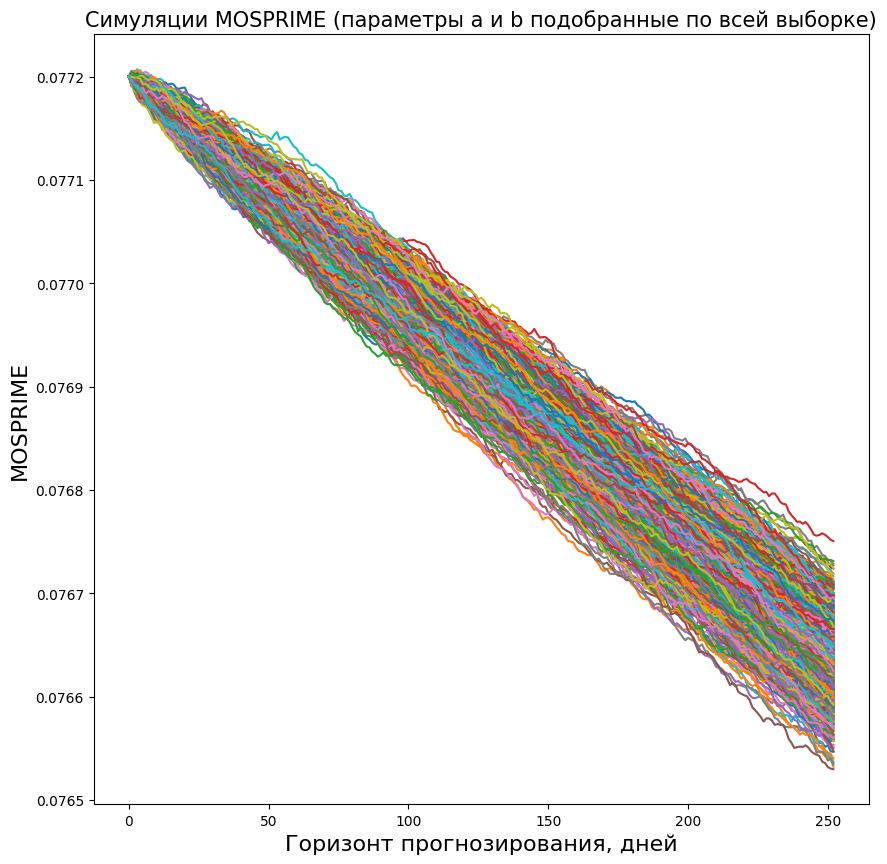

In [ ]:
# Создание объектов фигуры и осей
fig, ax = plt.subplots(figsize=(10, 10))

# Цикл по всем симуляциям в Simulated_MOSPRIME_corr
for i in range(len(Simulated_MOSPRIME_corr)):
    ax.plot(Simulated_MOSPRIME_corr[i])

# Настройка графика
ax.set_ylabel('MOSPRIME', fontsize=16)
ax.set_title('Симуляции MOSPRIME (параметры a и b подобранные по всей выборке)', fontsize=15)
ax.set_xlabel('Горизонт прогнозирования, дней', fontsize=16)

# Отображение графика
plt.show()

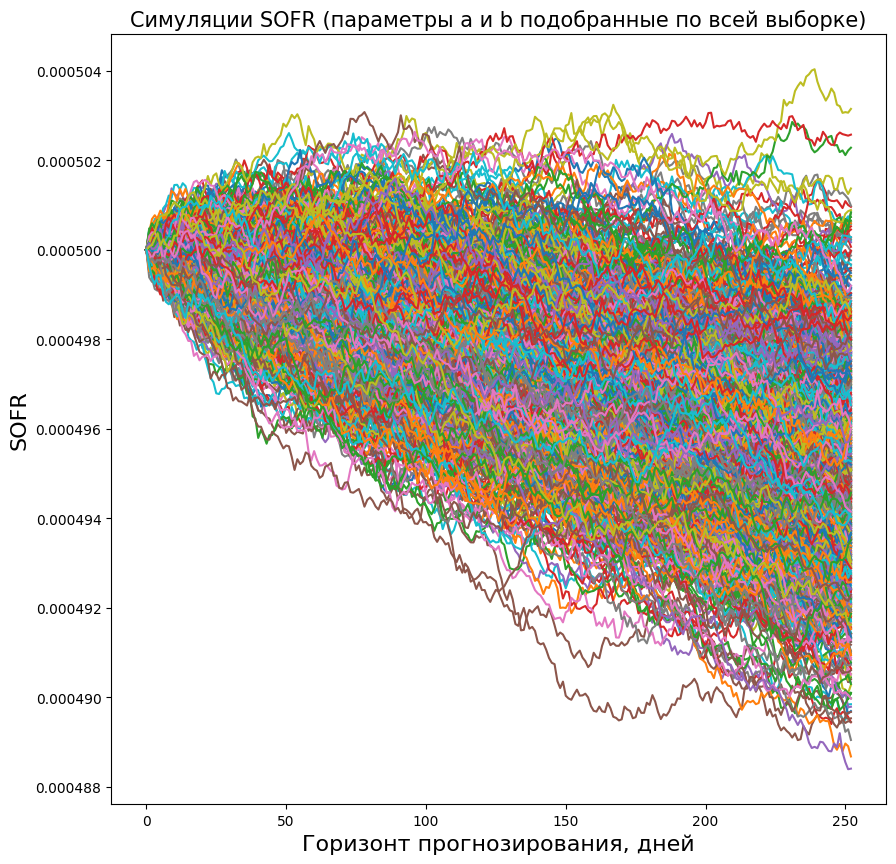

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
# Цикл по всем симуляциям в Simulated_MOSPRIME_corr
for i in range(len(Simulated_MOSPRIME_corr)):
    ax.plot(Simulated_SOFR_corr[i])

ax.set_ylabel('SOFR', fontsize=16)
ax.set_title('Симуляции SOFR (параметры a и b подобранные по всей выборке)', fontsize=15)
ax.set_xlabel('Горизонт прогнозирования, дней', fontsize=16)
# Отображение графика
plt.show()

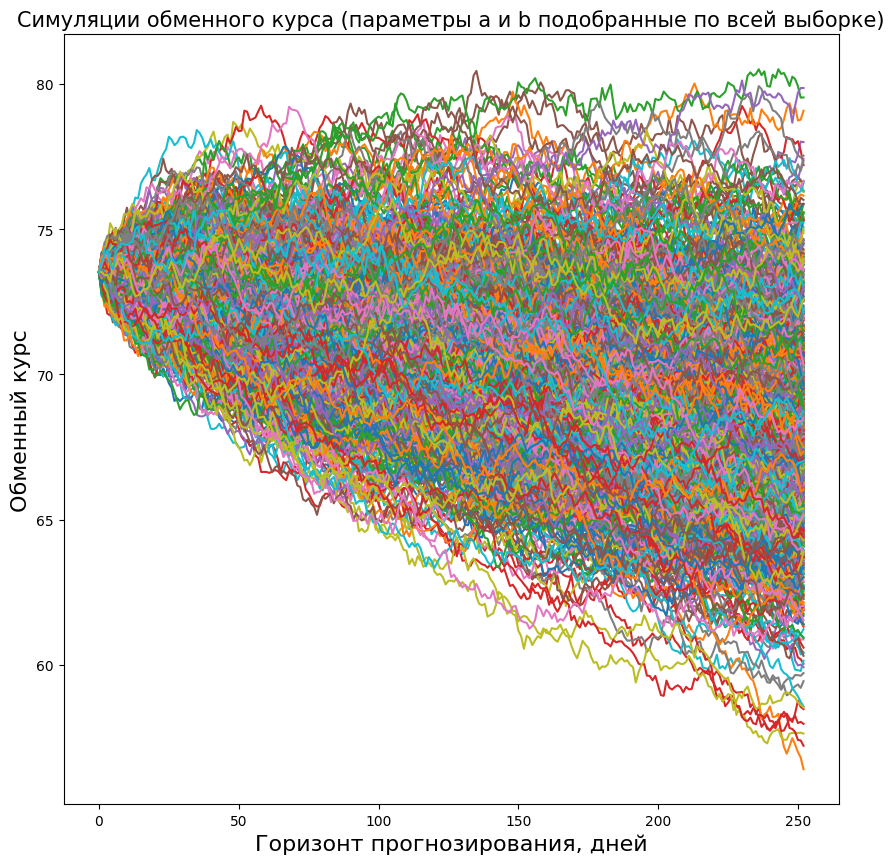

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
# Цикл по всем симуляциям в Simulated_MOSPRIME_corr
for i in range(len(Simulated_MOSPRIME_corr)):
    ax.plot(Simulated_CURR_corr[i])

ax.set_ylabel('Обменный курс', fontsize=16)
ax.set_title('Симуляции обменного курса (параметры a и b подобранные по всей выборке)', fontsize=15)
ax.set_xlabel('Горизонт прогнозирования, дней', fontsize=16)
# Отображение графика
plt.show()

##Подбор параметров по наиболее актуальным наблюдениям

In [ ]:
df_rates_new = df_rates.copy()
df_rates_new['ON_mosprime_lag'] = df_rates_new['ON_mosprime'].shift(1)
df_rates_new['ON_sofr_lag'] = df_rates_new['ON_sofr'].shift(1)
df_rates_new = df_rates_new[(df_rates_new['Date'] >= pd.to_datetime('01-04-2020', format='%d-%m-%Y'))].reset_index(drop=True)

In [ ]:
X = np.array(df_rates_new['ON_mosprime'])
Y = np.array(df_rates_new['ON_sofr'])
Z = np.array(df_rates_new['Close'])

# Создаём массив NumPy с векторами X и Y
data = np.array([X, Y, Z])

# Вычитаем среднее значение каждого вектора и разделите на стандартное отклонение
normalized_data = (data - data.mean(axis=1, keepdims=True)) / data.std(axis=1, keepdims=True)

# Вычисляем произведение всех попарных комбинаций векторов и среднее значение
correlation_matrix = np.dot(normalized_data, normalized_data.T) / len(X)

print(correlation_matrix)

[[ 1.         -0.26916576 -0.361339  ]
 [-0.26916576  1.         -0.05546593]
 [-0.361339   -0.05546593  1.        ]]


In [ ]:
dW_m = np.random.normal(0, np.sqrt(1 / df_rates_new['ON_mosprime'].shape[0]), df_rates_new['ON_mosprime'].shape[0])
dW_s = np.random.normal(0, np.sqrt(1 / df_rates_new['ON_sofr'].shape[0]), df_rates_new['ON_sofr'].shape[0])
dW_c = np.random.normal(0, np.sqrt(1 / df_rates_new['Close'].shape[0]), df_rates_new['Close'].shape[0])
dW_m_corr, dW_s_corr, dW_c_corr = generate_correlated_data(dW_m, dW_s, dW_c, correlation_matrix)

In [ ]:
best_rate = np.inf
best_params_MOS_last = (np.nan, np.nan)

for a in tqdm(np.linspace(0.001, 2, 1001)):
    for b in np.linspace(0.01, 0.1, 101):
        y_pred = df_rates_new['ON_mosprime_lag'] + a * (b - df_rates_new['ON_mosprime_lag'])  * 1 / df_rates_new['ON_mosprime'].shape[0] + df_rates_new['ON_mosprime'].std() * np.sqrt(df_rates_new['ON_mosprime_lag']) * dW_m_corr
        if mean_absolute_error(df_rates_new['ON_mosprime'][1:], y_pred[1:]) <= best_rate:
            best_params_MOS_last = (a, b)
            best_rate = mean_absolute_error(df_rates_new['ON_mosprime'][1:], y_pred[1:])

best_params_MOS_last, best_rate

100%|██████████| 1001/1001 [03:44<00:00,  4.46it/s]


((0.004998, 0.1), 0.0005829454710598141)

In [ ]:
best_rate = np.inf
best_params_SOFR_last = (np.nan, np.nan)

for a in tqdm(np.linspace(0.0001, 2, 1001)):
    for b in np.linspace(0.0001, 0.05, 101):
        y_pred = df_rates_new['ON_sofr_lag'] + a * (b - df_rates_new['ON_sofr_lag'])  * 1 / df_rates_new['ON_sofr'].shape[0] + df_rates_new['ON_sofr'].std() * np.sqrt(df_rates_new['ON_sofr_lag']) * dW_s_corr
        if mean_absolute_error(df_rates_new['ON_sofr'][1:], y_pred[1:]) <= best_rate:
            best_params_SOFR_last = (a, b)
            best_rate = mean_absolute_error(df_rates_new['ON_sofr'][1:], y_pred[1:])

best_params_SOFR_last, best_rate

100%|██████████| 1001/1001 [03:46<00:00,  4.41it/s]


((0.0001, 0.001098), 4.372036141446078e-05)

In [ ]:
# Параметры модели MOSPRIME
# r0_Mosprime = df_rates['ON_mosprime'].iloc[-1]  # Начальная процентная ставка
a_Mosprime = best_params_MOS_last[0]    # Скорость возврата к среднему уровню
b_Mosprime = best_params_MOS_last[1]   # Уровень средней ставки
sigma_Mosprime = df_rates_new['ON_mosprime'].std()  # Волатильность

# Параметры модели SOFR
# r0_SOFR = df_rates['ON_sofr'].iloc[-1]  # Начальная процентная ставка
a_SOFR = best_params_SOFR_last[0]    # Скорость возврата к среднему уровню
b_SOFR = best_params_SOFR_last[1]   # Уровень средней ставки
sigma_SOFR = df_rates_new['ON_sofr'].std()  # Волатильность

# Параметры модели Currency rate
# c0 = df_rates_new['Close'].iloc[-1]
# sigma_c = df_rates_new['Close'].std()

# Параметры симуляции
T = 1    # Общее время симуляции
dt = 1 / 252  # День торгов
num_paths = 1000  # Количество симуляционных путей

Simulated_MOSPRIME_corr, Simulated_SOFR_corr, Simulated_CURR_corr = cir_model(r0_Mosprime, a_Mosprime, b_Mosprime, sigma_Mosprime,
                                                         r0_SOFR, a_SOFR, b_SOFR, sigma_SOFR, c0, sigma_c,
                                                         T, dt, num_paths, correlation_matrix)

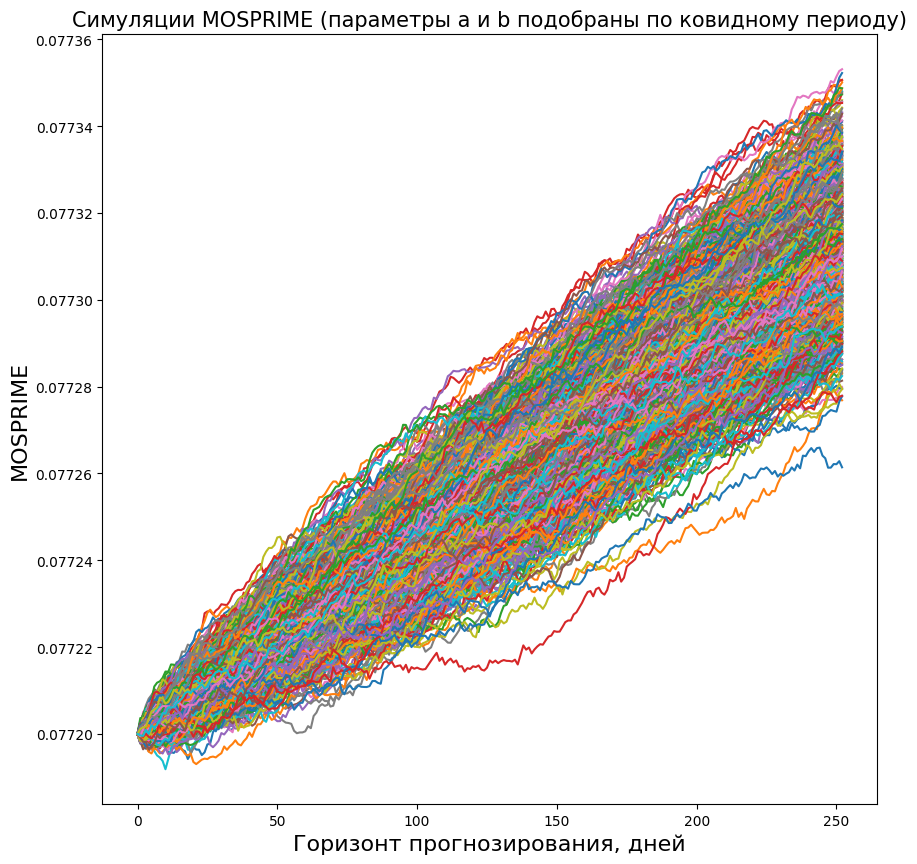

In [ ]:
# Создание объектов фигуры и осей
fig, ax = plt.subplots(figsize=(10, 10))

# Цикл по всем симуляциям в Simulated_MOSPRIME_corr
for i in range(len(Simulated_MOSPRIME_corr)):
    ax.plot(Simulated_MOSPRIME_corr[i])

# Настройка графика
ax.set_ylabel('MOSPRIME', fontsize=16)
ax.set_title('Симуляции MOSPRIME (параметры a и b подобраны по ковидному периоду)', fontsize=15)
ax.set_xlabel('Горизонт прогнозирования, дней', fontsize=16)

# Отображение графика
plt.show()

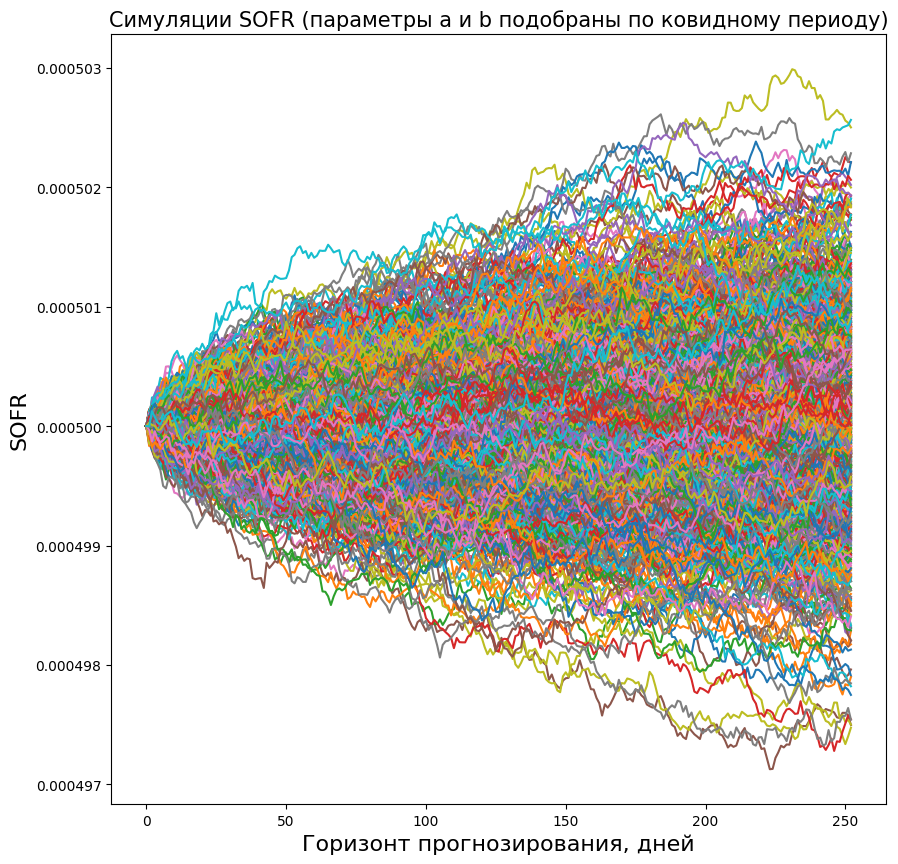

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
# Цикл по всем симуляциям в Simulated_MOSPRIME_corr
for i in range(len(Simulated_MOSPRIME_corr)):
    ax.plot(Simulated_SOFR_corr[i])

ax.set_ylabel('SOFR', fontsize=16)
ax.set_title('Симуляции SOFR (параметры a и b подобраны по ковидному периоду)', fontsize=15)
ax.set_xlabel('Горизонт прогнозирования, дней', fontsize=16)
# Отображение графика
plt.show()

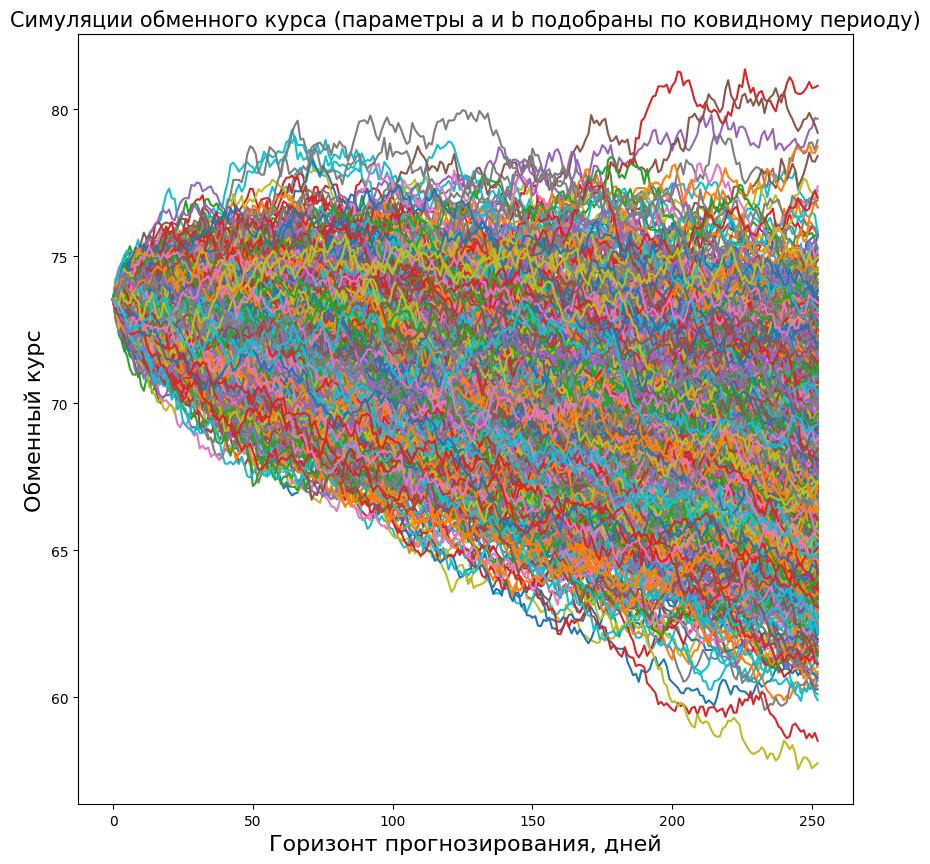

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
# Цикл по всем симуляциям в Simulated_MOSPRIME_corr
for i in range(len(Simulated_MOSPRIME_corr)):
    ax.plot(Simulated_CURR_corr[i])

ax.set_ylabel('Обменный курс', fontsize=16)
ax.set_title('Симуляции обменного курса (параметры a и b подобраны по ковидному периоду)', fontsize=15)
ax.set_xlabel('Горизонт прогнозирования, дней', fontsize=16)
# Отображение графика
plt.show()

##Подбор параметров по выборке до апреля 2020 года

In [ ]:
df_rates_new = df_rates.copy()
df_rates_new['ON_mosprime_lag'] = df_rates_new['ON_mosprime'].shift(1)
df_rates_new['ON_sofr_lag'] = df_rates_new['ON_sofr'].shift(1)
df_rates_new = df_rates_new[(df_rates_new['Date'] <= pd.to_datetime('13-03-2020', format='%d-%m-%Y'))].reset_index(drop=True)

In [ ]:
X = np.array(df_rates_new['ON_mosprime'])
Y = np.array(df_rates_new['ON_sofr'])
Z = np.array(df_rates_new['Close'])

# Создаём массив NumPy с векторами X и Y
data = np.array([X, Y, Z])

# Вычитаем среднее значение каждого вектора и разделите на стандартное отклонение
normalized_data = (data - data.mean(axis=1, keepdims=True)) / data.std(axis=1, keepdims=True)

# Вычисляем произведение всех попарных комбинаций векторов и среднее значение
correlation_matrix = np.dot(normalized_data, normalized_data.T) / len(X)

print(correlation_matrix)

[[1.         0.789489   0.22915531]
 [0.789489   1.         0.23269819]
 [0.22915531 0.23269819 1.        ]]


In [ ]:
dW_m = np.random.normal(0, np.sqrt(1 / df_rates_new['ON_mosprime'].shape[0]), df_rates_new['ON_mosprime'].shape[0])
dW_s = np.random.normal(0, np.sqrt(1 / df_rates_new['ON_sofr'].shape[0]), df_rates_new['ON_sofr'].shape[0])
dW_c = np.random.normal(0, np.sqrt(1 / df_rates_new['Close'].shape[0]), df_rates_new['Close'].shape[0])
dW_m_corr, dW_s_corr, dW_c_corr = generate_correlated_data(dW_m, dW_s, dW_c, correlation_matrix)

In [ ]:
best_rate = np.inf
best_params_MOS_first = (np.nan, np.nan)

for a in tqdm(np.linspace(0.001, 2, 1001)):
    for b in np.linspace(0.01, 0.1, 101):
        y_pred = df_rates_new['ON_mosprime_lag'] + a * (b - df_rates_new['ON_mosprime_lag'])  * 1 / df_rates_new['ON_mosprime'].shape[0] + df_rates_new['ON_mosprime'].std() * np.sqrt(df_rates_new['ON_mosprime_lag']) * dW_m_corr
        if mean_absolute_error(df_rates_new['ON_mosprime'][1:], y_pred[1:]) <= best_rate:
            best_params_MOS_first = (a, b)
            best_rate = mean_absolute_error(df_rates_new['ON_mosprime'][1:], y_pred[1:])

best_params_MOS_first, best_rate

100%|██████████| 1001/1001 [03:43<00:00,  4.47it/s]


((0.012993999999999999, 0.0568), 0.0004257280604530676)

In [ ]:
best_rate = np.inf
best_params_SOFR_first = (np.nan, np.nan)

for a in tqdm(np.linspace(0.0001, 2, 1001)):
    for b in np.linspace(0.0001, 0.05, 101):
        y_pred = df_rates_new['ON_sofr_lag'] + a * (b - df_rates_new['ON_sofr_lag'])  * 1 / df_rates_new['ON_sofr'].shape[0] + df_rates_new['ON_sofr'].std() * np.sqrt(df_rates_new['ON_sofr_lag']) * dW_s_corr
        if mean_absolute_error(df_rates_new['ON_sofr'][1:], y_pred[1:]) <= best_rate:
            best_params_SOFR_first = (a, b)
            best_rate = mean_absolute_error(df_rates_new['ON_sofr'][1:], y_pred[1:])

best_params_SOFR_first, best_rate

100%|██████████| 1001/1001 [03:55<00:00,  4.25it/s]


((0.0180991, 0.017065999999999998), 0.000446333354352213)

Симуляции с параметрами, оцененными на данных до начала пандемии

In [ ]:
# Параметры модели MOSPRIME
# r0_Mosprime = df_rates_new['ON_mosprime'].iloc[-1]  # Начальная процентная ставка
a_Mosprime = best_params_MOS_first[0]    # Скорость возврата к среднему уровню
b_Mosprime = best_params_MOS_first[1]   # Уровень средней ставки
sigma_Mosprime = df_rates_new['ON_mosprime'].std()  # Волатильность

# Параметры модели SOFR
# r0_SOFR = df_rates_new['ON_sofr'].iloc[-1]  # Начальная процентная ставка
a_SOFR = best_params_SOFR_first[0]    # Скорость возврата к среднему уровню
b_SOFR = best_params_SOFR_first[1]   # Уровень средней ставки
sigma_SOFR = df_rates_new['ON_sofr'].std()  # Волатильность

# Параметры модели Currency rate
# c0 = df_rates_new['Close'].iloc[-1]
# sigma_c = df_rates_new['Close'].std()

# Параметры симуляции
T = 1    # Общее время симуляции
dt = 1 / 252  # День торгов
num_paths = 1000  # Количество симуляционных путей

Simulated_MOSPRIME_corr, Simulated_SOFR_corr, Simulated_CURR_corr = cir_model(r0_Mosprime, a_Mosprime, b_Mosprime, sigma_Mosprime,
                                                         r0_SOFR, a_SOFR, b_SOFR, sigma_SOFR, c0, sigma_c,
                                                         T, dt, num_paths, correlation_matrix)

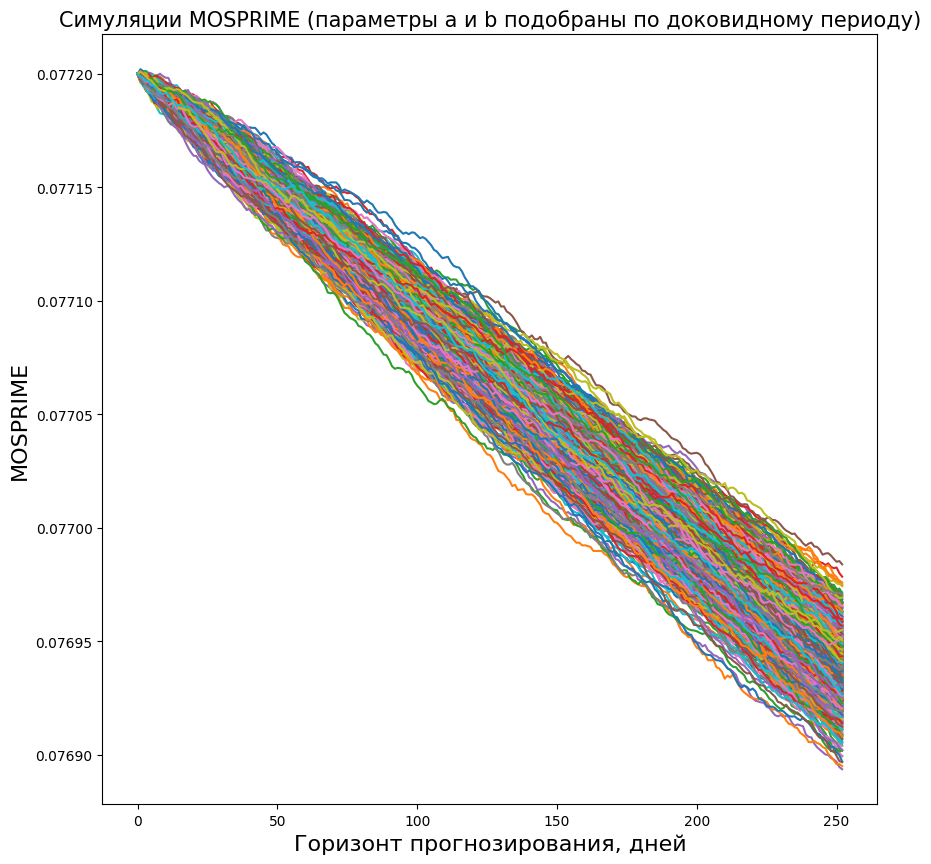

In [ ]:
# Создание объектов фигуры и осей
fig, ax = plt.subplots(figsize=(10, 10))

# Цикл по всем симуляциям в Simulated_MOSPRIME_corr
for i in range(len(Simulated_MOSPRIME_corr)):
    ax.plot(Simulated_MOSPRIME_corr[i])

# Настройка графика
ax.set_ylabel('MOSPRIME', fontsize=16)
ax.set_title('Симуляции MOSPRIME (параметры a и b подобраны по доковидному периоду)', fontsize=15)
ax.set_xlabel('Горизонт прогнозирования, дней', fontsize=16)

# Отображение графика
plt.show()

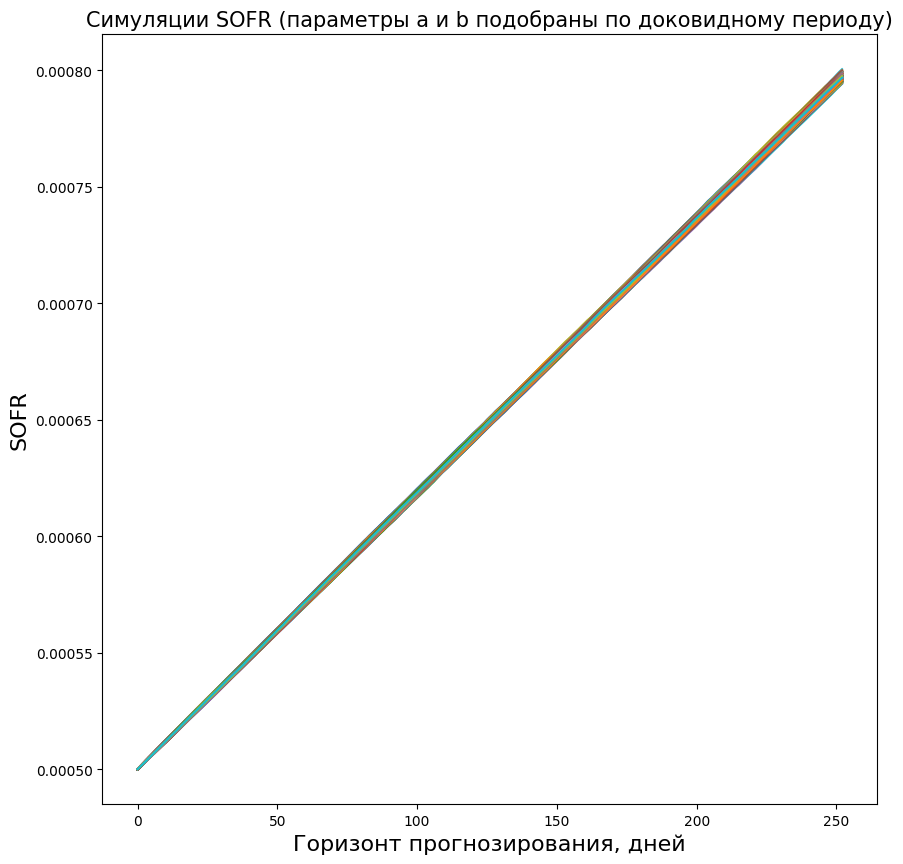

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
# Цикл по всем симуляциям в Simulated_MOSPRIME_corr
for i in range(len(Simulated_MOSPRIME_corr)):
    ax.plot(Simulated_SOFR_corr[i])

ax.set_ylabel('SOFR', fontsize=16)
ax.set_title('Симуляции SOFR (параметры a и b подобраны по доковидному периоду)', fontsize=15)
ax.set_xlabel('Горизонт прогнозирования, дней', fontsize=16)
# Отображение графика
plt.show()

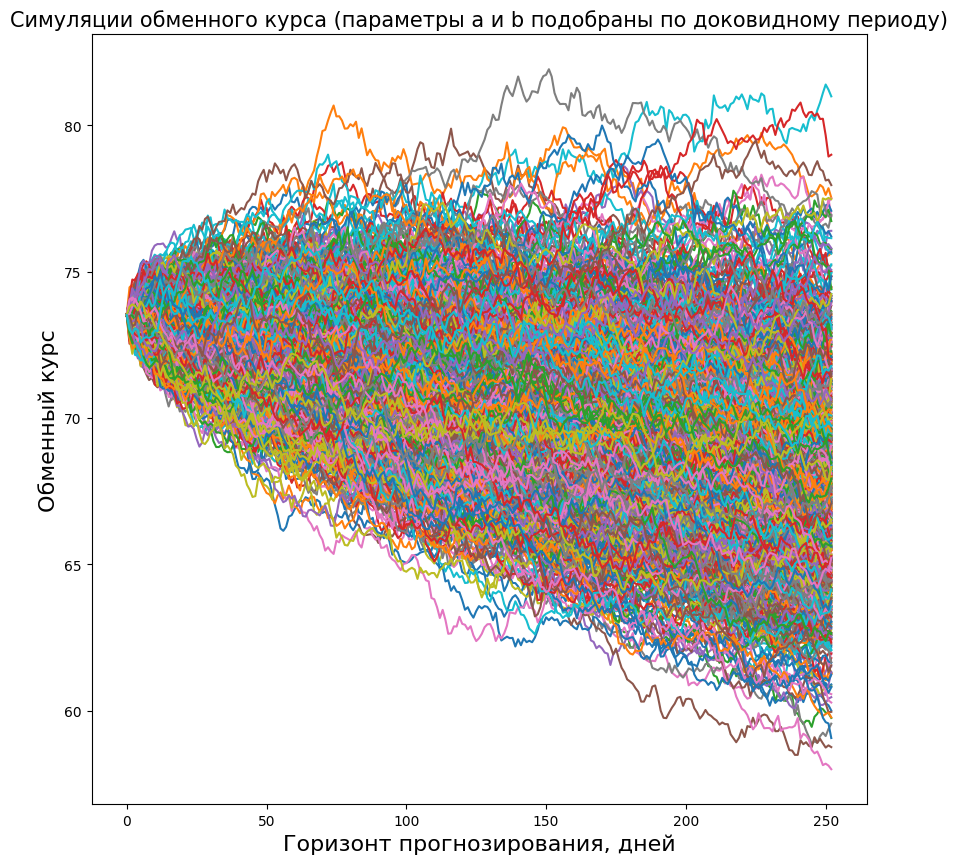

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
# Цикл по всем симуляциям в Simulated_MOSPRIME_corr
for i in range(len(Simulated_MOSPRIME_corr)):
    ax.plot(Simulated_CURR_corr[i])

ax.set_ylabel('Обменный курс', fontsize=16)
ax.set_title('Симуляции обменного курса (параметры a и b подобраны по доковидному периоду)', fontsize=15)
ax.set_xlabel('Горизонт прогнозирования, дней', fontsize=16)
# Отображение графика
plt.show()

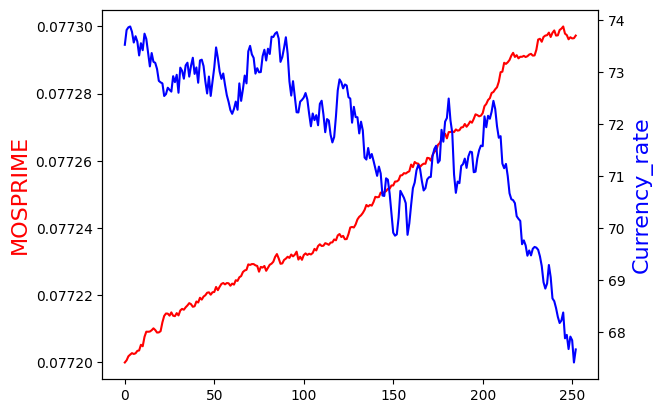

In [ ]:
for i in range(0, 1):
  fig,ax = plt.subplots()
  ax.plot(Simulated_MOSPRIME_corr[i], color='red')
  ax.set_ylabel('MOSPRIME', color='red', fontsize=16)
  ax2 = ax.twinx()
  ax2.plot(Simulated_CURR_corr[i], color='blue')
  ax2.set_ylabel('Currency_rate', color='blue', fontsize=16)

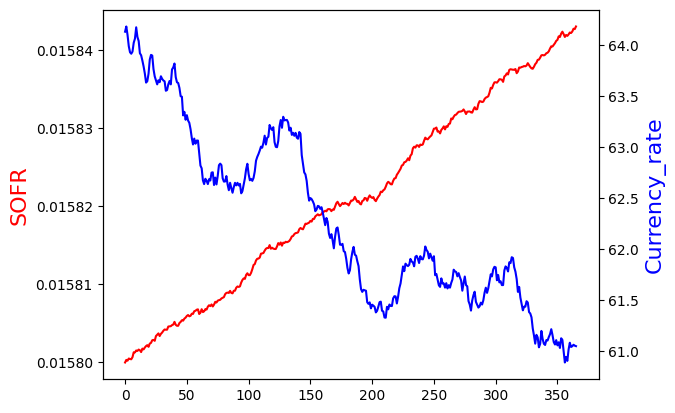

In [ ]:
for i in range(0, 1):
  fig,ax = plt.subplots()
  ax.plot(Simulated_SOFR_corr[i], color='red')
  ax.set_ylabel('SOFR', color='red', fontsize=16)
  ax2 = ax.twinx()
  ax2.plot(Simulated_CURR_corr[i], color='blue')
  ax2.set_ylabel('Currency_rate', color='blue', fontsize=16)

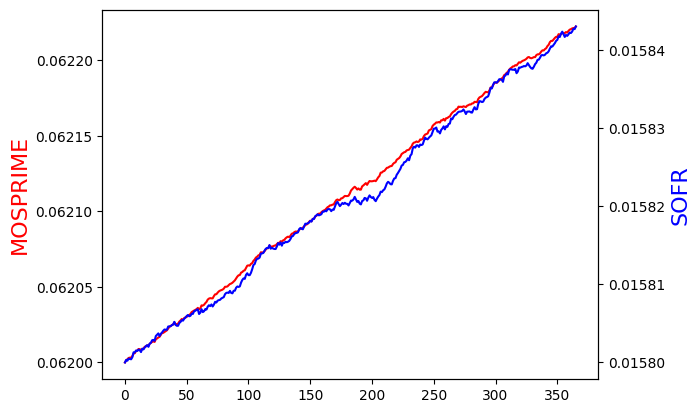

In [ ]:
for i in range(0, 1):
  fig,ax = plt.subplots()
  ax.plot(Simulated_MOSPRIME_corr[i], color='red')
  ax.set_ylabel('MOSPRIME', color='red', fontsize=16)
  ax2 = ax.twinx()
  ax2.plot(Simulated_SOFR_corr[i], color='blue')
  ax2.set_ylabel('SOFR', color='blue', fontsize=16)

#Задание 2

In [ ]:
def pricing_range_accrual(notional, start_date, end_date, simulations, upper_bound=np.inf, lower_bound=-np.inf, r_no_risk=0):
    start_date = datetime.strptime(start_date, '%Y-%m-%d')
    end_date = datetime.strptime(end_date, '%Y-%m-%d')
    total_days = (end_date - start_date).days
    payouts = []

    for sim in simulations:
        days_within_range = 0

        for i, rate in enumerate(sim):
            date = start_date + timedelta(days=i)
            if start_date <= date <= end_date:
                if lower_bound <= rate <= upper_bound:
                    days_within_range += 1

        payout = notional * days_within_range / (min(total_days + 1, len(sim))) / ((1 + r_no_risk)**((min(total_days + 1, len(sim))) / 365))
        payouts.append(payout)

    fair_value = np.mean(payouts)
    return fair_value

In [ ]:
Simulated_CURR_corr.max()

81.3620562364377

In [ ]:
Simulated_CURR_corr.min()

57.54712680754083

In [ ]:
# notional - номинал, мксимальная выплата, если все значения обменного курса будут внутри диапозона
price = pricing_range_accrual(notional=100, start_date='2021-12-10', end_date='2022-03-31', simulations=Simulated_CURR_corr, upper_bound=70, lower_bound=60)

print(f'Стоимость опциона range accrual по заданным параметрам равна {price}.')

Стоимость опциона range accrual по заданным параметрам равна 11.805357142857144.


In [ ]:
price = pricing_range_accrual(notional=100, start_date='2017-01-01', end_date='2017-01-06', simulations=Simulated_CURR_corr, upper_bound=100, lower_bound=50)

print(f'Стоимость опциона range accrual по заданным параметрам равна {price}.')

Стоимость опциона range accrual по заданным параметрам равна 100.0.


In [ ]:
price = pricing_range_accrual(notional=100, start_date='2017-01-01', end_date='2017-01-06', simulations=Simulated_CURR_corr, upper_bound=100, lower_bound=50,
                              r_no_risk=0.1) # дисконтирование (добавили просто так, по заданию этого делать не нужно было, поэтому по дефолту занулили параметр)

print(f'Стоимость опциона range accrual по заданным параметрам равна {price}.')

Стоимость опциона range accrual по заданным параметрам равна 99.84344840188756.


##Дополнительная модель к заданию 1

In [14]:
def vasicek_model(r0_m, a_m, b_m, sigma_m, r0_s, a_s, b_s, sigma_s, c0, sigma_c, T_, dt_, num_paths, corr):
    """
    :param r0: Начальная процентная ставка
    :param c0: Начальное значение обменного курса
    :param a: Скорость возврата к среднему уровню
    :param b: Уровень средней ставки
    :param sigma: Волатильность
    :param T: Общее время симуляции
    :param dt: Шаг времени
    :param num_paths: Количество симуляционных путей
    :return: Массив процентных ставок по времени для каждого пути
    """
    num_steps = int(T / dt)

    paths_m = np.zeros((num_paths, num_steps + 1))
    paths_m[:, 0] = r0_m

    paths_s = np.zeros((num_paths, num_steps + 1))
    paths_s[:, 0] = r0_s

    paths_c = np.zeros((num_paths, num_steps + 1))
    paths_c[:, 0] = c0

    for i in range(0, num_paths):
        dW_m = np.random.normal(0, np.sqrt(dt), num_steps)
        dW_s = np.random.normal(0, np.sqrt(dt), num_steps)
        dW_c = np.random.normal(0, np.sqrt(dt), num_steps)
        dW_m_corr, dW_s_corr, dW_c_corr = generate_correlated_data(dW_m, dW_s, dW_c, corr)
        for t in range(1, num_steps + 1):
          paths_m[i, t] = paths_m[i, t - 1] + a_m * (b_m - paths_m[i, t - 1]) * dt + sigma_m * dW_m_corr[t - 1]
          paths_s[i, t] = paths_s[i, t - 1] + a_s * (b_s - paths_s[i, t - 1]) * dt + sigma_s * dW_s_corr[t - 1]
          paths_c[i, t] = paths_c[i, t - 1] + paths_c[i, t - 1] * ((paths_s[i, t] - paths_m[i, t]) * dt + sigma_c * dW_c_corr[t - 1])
    return paths_m, paths_s, paths_c

In [15]:
df_rates_new = df_rates.copy()
df_rates_new['ON_mosprime_lag'] = df_rates_new['ON_mosprime'].shift(1)
df_rates_new['ON_sofr_lag'] = df_rates_new['ON_sofr'].shift(1)
df_rates_new = df_rates_new[(df_rates_new['Date'] >= pd.to_datetime('01-04-2020', format='%d-%m-%Y'))].reset_index(drop=True)

In [16]:
X = np.array(df_rates_new['ON_mosprime'])
Y = np.array(df_rates_new['ON_sofr'])
Z = np.array(df_rates_new['Close'])

# Создаём массив NumPy с векторами X и Y
data = np.array([X, Y, Z])

# Вычитаем среднее значение каждого вектора и разделите на стандартное отклонение
normalized_data = (data - data.mean(axis=1, keepdims=True)) / data.std(axis=1, keepdims=True)

# Вычисляем произведение всех попарных комбинаций векторов и среднее значение
correlation_matrix = np.dot(normalized_data, normalized_data.T) / len(X)

print(correlation_matrix)

[[ 1.         -0.26916576 -0.361339  ]
 [-0.26916576  1.         -0.05546593]
 [-0.361339   -0.05546593  1.        ]]


In [17]:
dW_m = np.random.normal(0, np.sqrt(1 / df_rates_new['ON_mosprime'].shape[0]), df_rates_new['ON_mosprime'].shape[0])
dW_s = np.random.normal(0, np.sqrt(1 / df_rates_new['ON_sofr'].shape[0]), df_rates_new['ON_sofr'].shape[0])
dW_c = np.random.normal(0, np.sqrt(1 / df_rates_new['Close'].shape[0]), df_rates_new['Close'].shape[0])
dW_m_corr, dW_s_corr, dW_c_corr = generate_correlated_data(dW_m, dW_s, dW_c, correlation_matrix)

In [19]:
best_rate = np.inf
best_params_MOS_last1 = (np.nan, np.nan)

for a in tqdm(np.linspace(0.001, 2, 1001)):
    for b in np.linspace(0.01, 0.1, 101):
        y_pred = df_rates_new['ON_mosprime_lag'] + a * (b - df_rates_new['ON_mosprime_lag'])  * 1 / df_rates_new['ON_mosprime'].shape[0] + df_rates_new['ON_mosprime'].std() * dW_m_corr
        if mean_absolute_error(df_rates_new['ON_mosprime'][1:], y_pred[1:]) <= best_rate:
            best_params_MOS_last1 = (a, b)
            best_rate = mean_absolute_error(df_rates_new['ON_mosprime'][1:], y_pred[1:])

best_params_MOS_last1, best_rate

100%|██████████| 1001/1001 [03:08<00:00,  5.31it/s]


((0.006997, 0.1), 0.0005829357191288313)

In [20]:
best_rate = np.inf
best_params_SOFR_last1 = (np.nan, np.nan)

for a in tqdm(np.linspace(0.0001, 2, 1001)):
    for b in np.linspace(0.0001, 0.05, 101):
        y_pred = df_rates_new['ON_sofr_lag'] + a * (b - df_rates_new['ON_sofr_lag'])  * 1 / df_rates_new['ON_sofr'].shape[0] + df_rates_new['ON_sofr'].std() * dW_s_corr
        if mean_absolute_error(df_rates_new['ON_sofr'][1:], y_pred[1:]) <= best_rate:
            best_params_SOFR_last1 = (a, b)
            best_rate = mean_absolute_error(df_rates_new['ON_sofr'][1:], y_pred[1:])

best_params_SOFR_last1, best_rate

100%|██████████| 1001/1001 [02:53<00:00,  5.78it/s]


((0.048097600000000004, 0.000599), 4.379840995498144e-05)

In [22]:
r0_Mosprime = df_rates['ON_mosprime'].iloc[-1]  # Начальная процентная ставка
a_Mosprime = best_params_MOS_last1[0]    # Скорость возврата к среднему уровню
b_Mosprime = best_params_MOS_last1[1]   # Уровень средней ставки
sigma_Mosprime = df_rates_new['ON_mosprime'].std()  # Волатильность

# Параметры модели SOFR
r0_SOFR = df_rates['ON_sofr'].iloc[-1]  # Начальная процентная ставка
a_SOFR = best_params_SOFR_last1[0]    # Скорость возврата к среднему уровню
b_SOFR = best_params_SOFR_last1[1]   # Уровень средней ставки
sigma_SOFR = df_rates_new['ON_sofr'].std()  # Волатильность

# Параметры модели Currency rate
c0 = df_rates['Close'].iloc[-1]
sigma_c = df_rates['Close'].std()

# Параметры симуляции
T = 1    # Общее время симуляции
dt = 1 / 252  # День торгов
num_paths = 1000  # Количество симуляционных путей

Simulated_MOSPRIME_corr, Simulated_SOFR_corr, Simulated_CURR_corr = vasicek_model(r0_Mosprime, a_Mosprime, b_Mosprime, sigma_Mosprime,
                                                         r0_SOFR, a_SOFR, b_SOFR, sigma_SOFR, c0, sigma_c,
                                                         T, dt, num_paths, correlation_matrix)

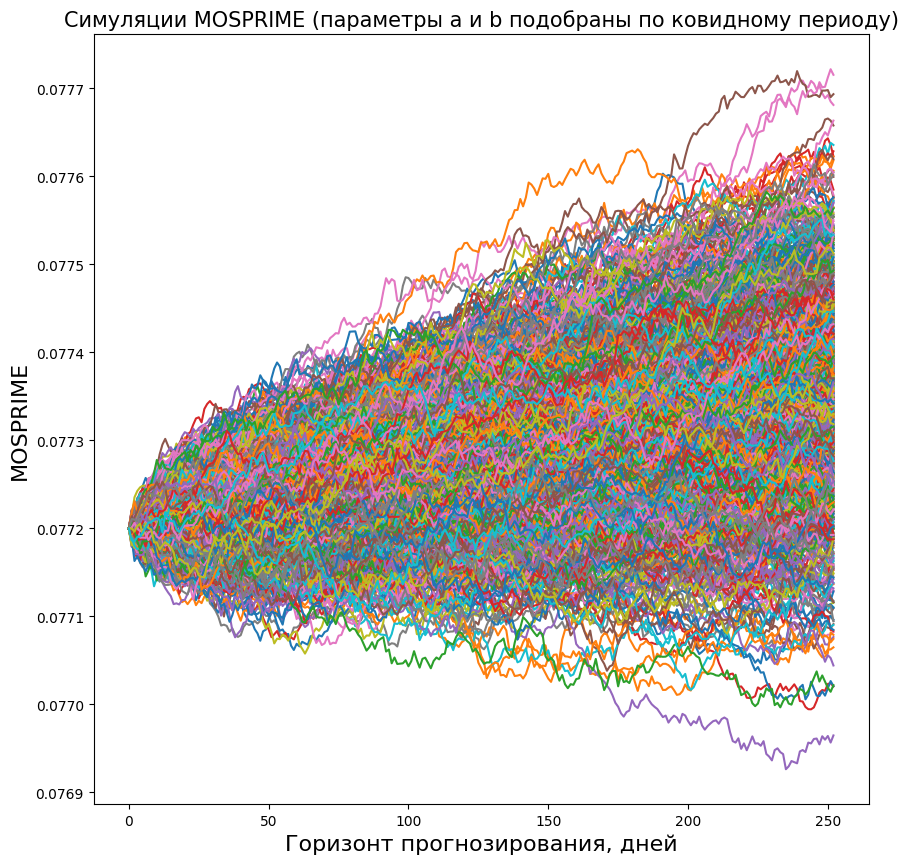

In [23]:
# Создание объектов фигуры и осей
fig, ax = plt.subplots(figsize=(10, 10))

# Цикл по всем симуляциям в Simulated_MOSPRIME_corr
for i in range(len(Simulated_MOSPRIME_corr)):
    ax.plot(Simulated_MOSPRIME_corr[i])

# Настройка графика
ax.set_ylabel('MOSPRIME', fontsize=16)
ax.set_title('Симуляции MOSPRIME (параметры a и b подобраны по ковидному периоду)', fontsize=15)
ax.set_xlabel('Горизонт прогнозирования, дней', fontsize=16)

# Отображение графика
plt.show()

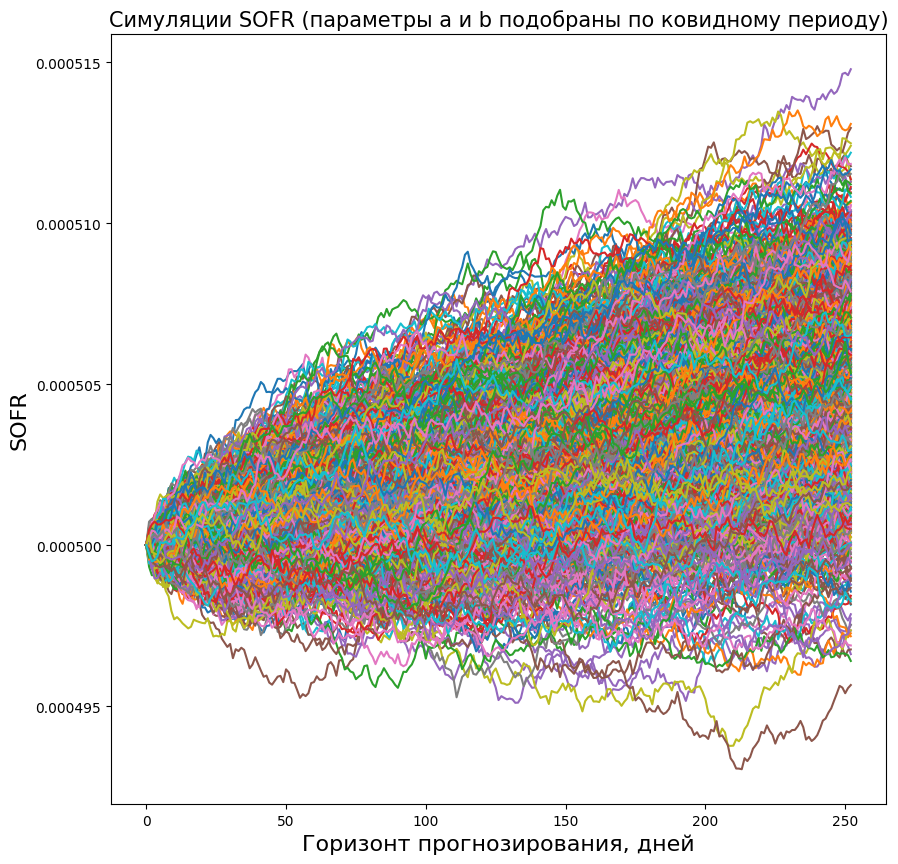

In [24]:
fig, ax = plt.subplots(figsize=(10, 10))
# Цикл по всем симуляциям в Simulated_MOSPRIME_corr
for i in range(len(Simulated_MOSPRIME_corr)):
    ax.plot(Simulated_SOFR_corr[i])

ax.set_ylabel('SOFR', fontsize=16)
ax.set_title('Симуляции SOFR (параметры a и b подобраны по ковидному периоду)', fontsize=15)
ax.set_xlabel('Горизонт прогнозирования, дней', fontsize=16)
# Отображение графика
plt.show()

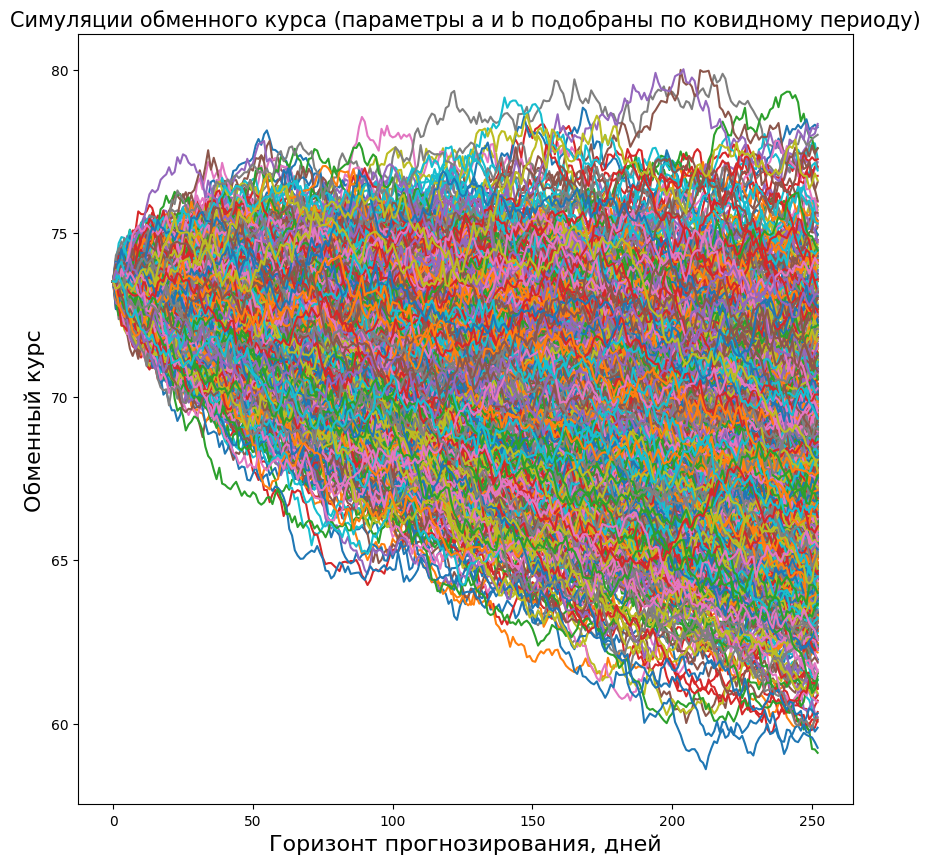

In [25]:
fig, ax = plt.subplots(figsize=(10, 10))
# Цикл по всем симуляциям в Simulated_MOSPRIME_corr
for i in range(len(Simulated_MOSPRIME_corr)):
    ax.plot(Simulated_CURR_corr[i])

ax.set_ylabel('Обменный курс', fontsize=16)
ax.set_title('Симуляции обменного курса (параметры a и b подобраны по ковидному периоду)', fontsize=15)
ax.set_xlabel('Горизонт прогнозирования, дней', fontsize=16)
# Отображение графика
plt.show()
